In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/weight109/densenet201_weights_tf_dim_ordering_tf_kernels_notop.h5
/kaggle/input/weight109/resnet50_weights_tf_dim_ordering_tf_kernels_notop.h5
/kaggle/input/weight109/xception_weights_tf_dim_ordering_tf_kernels_notop.h5
/kaggle/input/weight109/mobilenet_7_5_224_tf_no_top.h5
/kaggle/input/weight109/vgg16_weights_tf_dim_ordering_tf_kernels_notop.h5
/kaggle/input/weight109/NASNet-large-no-top.h5
/kaggle/input/weight109/mobilenet_v2_weights_tf_dim_ordering_tf_kernels_1.0_224_no_top.h5
/kaggle/input/weight109/vgg19_weights_tf_dim_ordering_tf_kernels_notop.h5
/kaggle/input/mango1/Mango/aug.py
/kaggle/input/mango1/Mango/archive/Stage_2 (Partially Ripe)/PR318.jpg
/kaggle/input/mango1/Mango/archive/Stage_2 (Partially Ripe)/PR104.jpg
/kaggle/input/mango1/Mango/archive/Stage_2 (Partially Ripe)/PR857.jpg
/kaggle/input/mango1/Mango/archive/Stage_2 (Partially Ripe)/PR331.jpg
/kaggle/input/mango1/Mango/archive/Stage_2 (Partially Ripe)/PR26.jpg
/kaggle/input/mango1/Mango/archive/Stage_2 

In [2]:
from tensorflow.keras.applications import EfficientNetV2B0
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Dropout, Input, GlobalAveragePooling2D
from tensorflow.keras.layers import LayerNormalization, MultiHeadAttention, Add, Flatten
from tensorflow.keras.optimizers import Adam
import os
import numpy as np
import pandas as pd
import cv2
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import VGG19
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Flatten, Dense
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
import os
import numpy as np
from tensorflow.keras.preprocessing.image import img_to_array, load_img
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder


In [3]:
pip install split-folders


/opt/conda/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


Note: you may need to restart the kernel to use updated packages.


In [4]:
import splitfolders

# Path to the original dataset
input_folder = '/kaggle/input/mango1/Mango/archive'

# Output folder for split datasets
output_folder = '/kaggle/working/split_dataset'

# Split into 80% train, 10% val, 10% test
splitfolders.ratio(input_folder, output=output_folder, seed=42, ratio=(0.8, 0.1, 0.1))


Copying files: 6000 files [00:28, 207.04 files/s]


In [5]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

batch_size =64
img_size = 224

# Create separate data generators for each split
train_datagen = ImageDataGenerator(rescale=1/255.,    rotation_range=30,      # Rotate images by up to 30 degrees
    width_shift_range=0.1,  # Shift width by up to 10%
    height_shift_range=0.1, # Shift height by up to 10%
    zoom_range=0.1,                                        # Zoom images in by up to 10%
    fill_mode='nearest' )    # Fill any missing pixels within the frame)

val_test_datagen = ImageDataGenerator(rescale=1/255.)

# Load data from the split folders
train_generator = train_datagen.flow_from_directory(
    '/kaggle/working/split_dataset/train',
    target_size=(img_size, img_size),
    batch_size=batch_size,
    shuffle=True,
    class_mode='categorical')

validation_generator = val_test_datagen.flow_from_directory(
    '/kaggle/working/split_dataset/val',
    target_size=(img_size, img_size),
    batch_size=batch_size,
    shuffle=False,
    class_mode='categorical')

test_generator = val_test_datagen.flow_from_directory(
    '/kaggle/working/split_dataset/test',
    target_size=(img_size, img_size),
    batch_size=batch_size,
    shuffle=False,
    class_mode='categorical')


Found 4800 images belonging to 6 classes.
Found 600 images belonging to 6 classes.
Found 600 images belonging to 6 classes.


In [6]:
from tensorflow.keras.layers import Input, BatchNormalization, Flatten, Dense
from tensorflow.keras.applications import DenseNet201
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Model

def Combined_model():
    # Input layer
    input_layer = Input(shape=(224, 224, 3))
    
    # Base DenseNet201 model as a feature extractor
    baseModel = DenseNet201(weights=None, include_top=False, input_tensor=input_layer)
    
    # Load the weights from the local file
    baseModel.load_weights('/kaggle/input/weight109/densenet201_weights_tf_dim_ordering_tf_kernels_notop.h5')
    
    # Freeze the layers of the DenseNet201 model
    for layer in baseModel.layers:
        layer.trainable = False
    
    x = baseModel.output
    
    # Flatten the output from DenseNet201
    x = Flatten(name="flatten")(x)
    
    # Fully connected (fc1) layer
    x = Dense(units=1024, activation='relu')(x)
    x = BatchNormalization()(x)
    
    # Fully connected (fc2) layer
    x = Dense(units=1024, activation='relu')(x)
    x = BatchNormalization()(x)
    
    # Output layer
    output = Dense(units=6, activation='softmax')(x)
    
    model = Model(inputs=input_layer, outputs=output)
    
    # Optimizer with learning rate
    opt = Adam(learning_rate=1e-4)
    
    model.compile(loss='categorical_crossentropy', 
                  optimizer=opt, 
                  metrics=["accuracy"])
    
    return model

# Create the model
model = Combined_model()

# Print the model summary
model.summary()


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d      │ (None, 230, 230,  │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,408 │ zero_padding2d[0… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_1    │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 56, 56,    │          0 │ zero_padding2d_1… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 56, 56,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 56, 56,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 56, 56,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 56, 56,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 56, 56,    │     12,288 │ conv2_block2_0_r

 Total params: 115,724,870 (441.46 MB)

 Trainable params: 97,398,790 (371.55 MB)

 Non-trainable params: 18,326,080 (69.91 MB)

In [7]:
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau, CSVLogger
model_name = "mangos.keras"  # Changed from model.h5 to model.keras

checkpoint = ModelCheckpoint(model_name,
                             monitor="val_accuracy",
                             mode="min",
                             save_best_only=True,
                             verbose=1)

earlystopping = EarlyStopping(monitor='val_accuracy',min_delta = 0, patience = 10, verbose = 1, restore_best_weights=True)

learning_rate_reduction = ReduceLROnPlateau(monitor='val_accuracy', 
                                            patience=3, 
                                            verbose=1, 
                                            factor=0.2, 
                                            min_lr=0.00000001)

In [8]:
history = model.fit(train_generator,
                    epochs=50,
                    validation_data=validation_generator,
                    callbacks=[checkpoint,earlystopping,learning_rate_reduction])

Epoch 1/50


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
I0000 00:00:1734893676.897709     123 service.cc:145] XLA service 0x7a8d9c004ab0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1734893676.897763     123 service.cc:153]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1734893676.897767     123 service.cc:153]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1734893707.556376     123 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.7816 - loss: 0.6712
Epoch 1: val_accuracy improved from inf to 0.89667, saving model to mangos.keras
75/75 ━━━━━━━━━━━━━━━━━━━━ 200s 2s/step - accuracy: 0.7828 - loss: 0.6674 - val_accuracy: 0.8967 - val_loss: 0.3040 - learning_rate: 1.0000e-04
Epoch 2/50
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.9477 - loss: 0.1549
Epoch 2: val_accuracy did not improve from 0.89667
75/75 ━━━━━━━━━━━━━━━━━━━━ 116s 1s/step - accuracy: 0.9477 - loss: 0.1548 - val_accuracy: 0.9450 - val_loss: 0.1727 - learning_rate: 1.0000e-04
Epoch 3/50
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.9581 - loss: 0.1169
Epoch 3: val_accuracy did not improve from 0.89667
75/75 ━━━━━━━━━━━━━━━━━━━━ 116s 1s/step - accuracy: 0.9581 - loss: 0.1168 - val_accuracy: 0.9667 - val_loss: 0.0936 - learning_rate: 1.0000e-04
Epoch 4/50
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.9737 - loss: 0.0747
Epoch 4: val_accuracy did not improve from 0.89667
75/75 ━━━━━━━

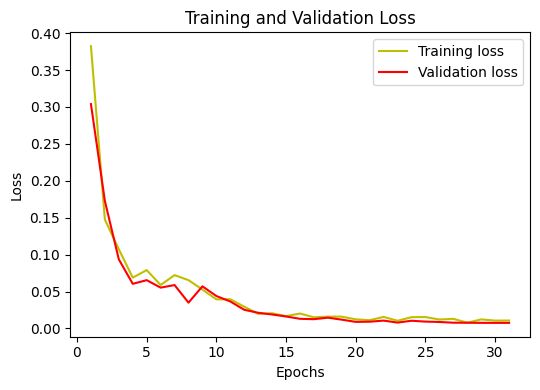

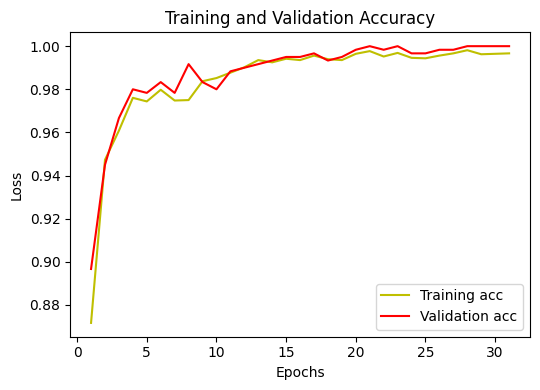

In [9]:
import matplotlib.pyplot as plt

loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.figure(figsize=(5.5, 4))

plt.plot(epochs, loss, 'y', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and Validation Loss', fontsize=12)
plt.xlabel('Epochs', fontsize=10)
plt.ylabel('Loss', fontsize=10)
plt.legend(fontsize=10)

plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

plt.grid(False)

plt.tight_layout()
plt.show()

loss = history.history['accuracy']
val_loss = history.history['val_accuracy']
epochs = range(1, len(loss) + 1)

plt.figure(figsize=(5.5, 4))

plt.plot(epochs, loss, 'y', label='Training acc')
plt.plot(epochs, val_loss, 'r', label='Validation acc')
plt.title('Training and Validation Accuracy', fontsize=12)
plt.xlabel('Epochs', fontsize=10)
plt.ylabel('Loss', fontsize=10)
plt.legend(fontsize=10)

plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

plt.grid(False)

plt.tight_layout()
plt.show()

In [10]:
test_loss, test_accuracy = model.evaluate(
    test_generator,
)
print(f"Test Accuracy: {test_accuracy:.2f}")

10/10 ━━━━━━━━━━━━━━━━━━━━ 9s 926ms/step - accuracy: 0.9900 - loss: 0.0390
Test Accuracy: 0.99


In [11]:
# Use the test generator for final evaluation
y_test = test_generator.classes  # True class labels for the test set

# Get predictions from the model for the test set
y_pred = model.predict(test_generator)

# Convert predicted probabilities to class labels
y_pred = np.argmax(y_pred, axis=1)


10/10 ━━━━━━━━━━━━━━━━━━━━ 33s 2s/step 


In [12]:
from sklearn.metrics import classification_report

print(classification_report(y_test, y_pred))


              precision    recall  f1-score   support

           0       0.98      0.99      0.99       100
           1       0.99      0.98      0.98       100
           2       1.00      1.00      1.00       100
           3       1.00      1.00      1.00       100
           4       0.99      0.99      0.99       100
           5       0.99      0.99      0.99       100

    accuracy                           0.99       600
   macro avg       0.99      0.99      0.99       600
weighted avg       0.99      0.99      0.99       600



10/10 ━━━━━━━━━━━━━━━━━━━━ 8s 870ms/step


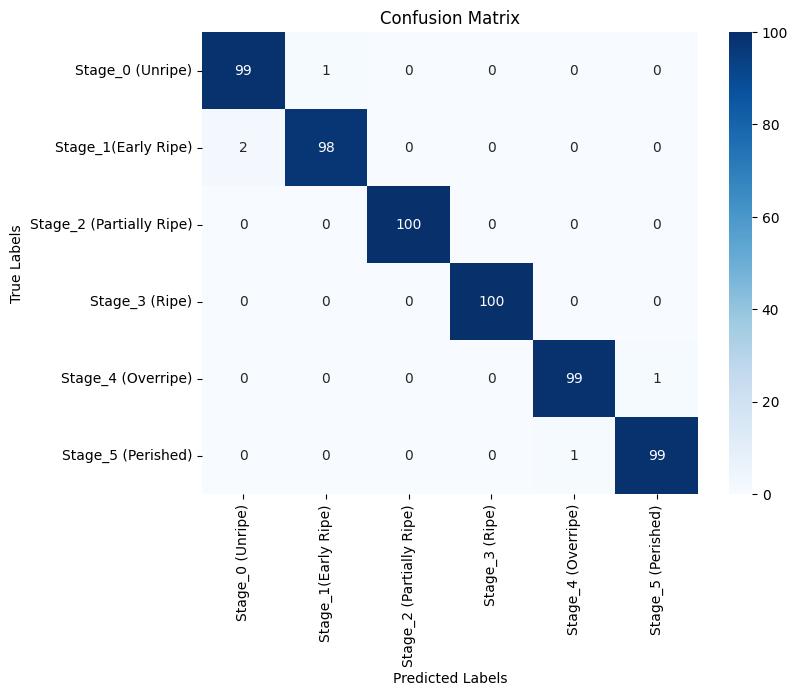

In [13]:
import numpy as np
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Get true labels and predicted labels for the test set
y_test = test_generator.classes  # True class labels for the test set
y_pred = model.predict(test_generator)  # Get predictions
y_pred = np.argmax(y_pred, axis=1)  # Convert probabilities to class labels

# Compute the confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Plot the confusion matrix using seaborn heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=test_generator.class_indices.keys(), yticklabels=test_generator.class_indices.keys())
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()


10/10 ━━━━━━━━━━━━━━━━━━━━ 8s 855ms/step


/tmp/ipykernel_23/1461091320.py:31: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10')(np.linspace(0, 1, n_classes))


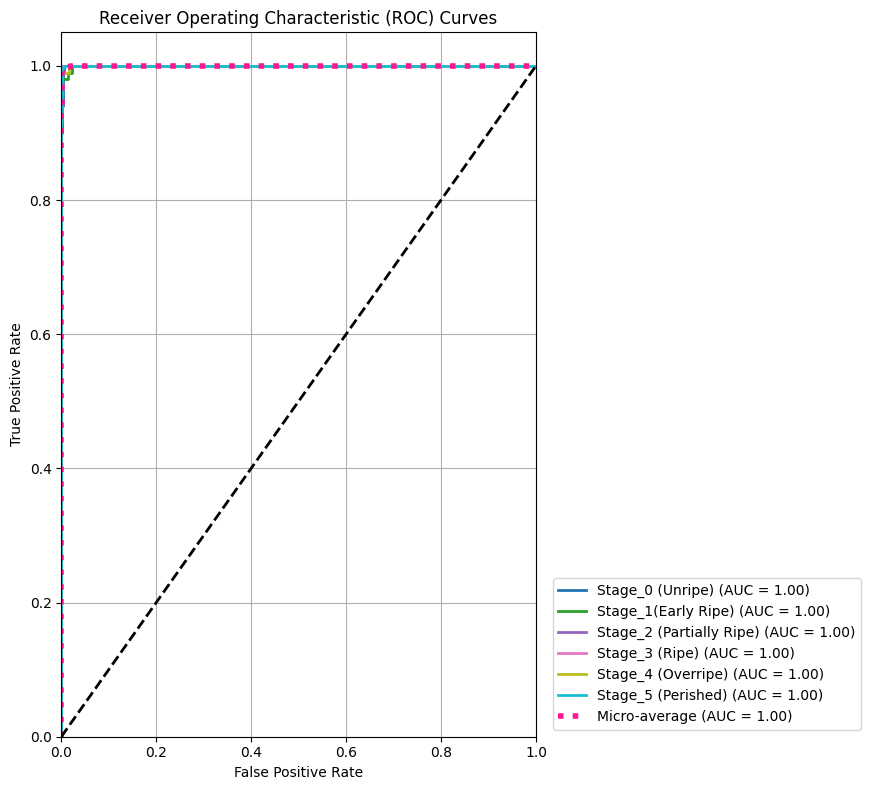


AUC Scores:
Stage_0 (Unripe): 1.000
Stage_1(Early Ripe): 1.000
Stage_2 (Partially Ripe): 1.000
Stage_3 (Ripe): 1.000
Stage_4 (Overripe): 1.000
Stage_5 (Perished): 1.000
Micro-average: 1.000


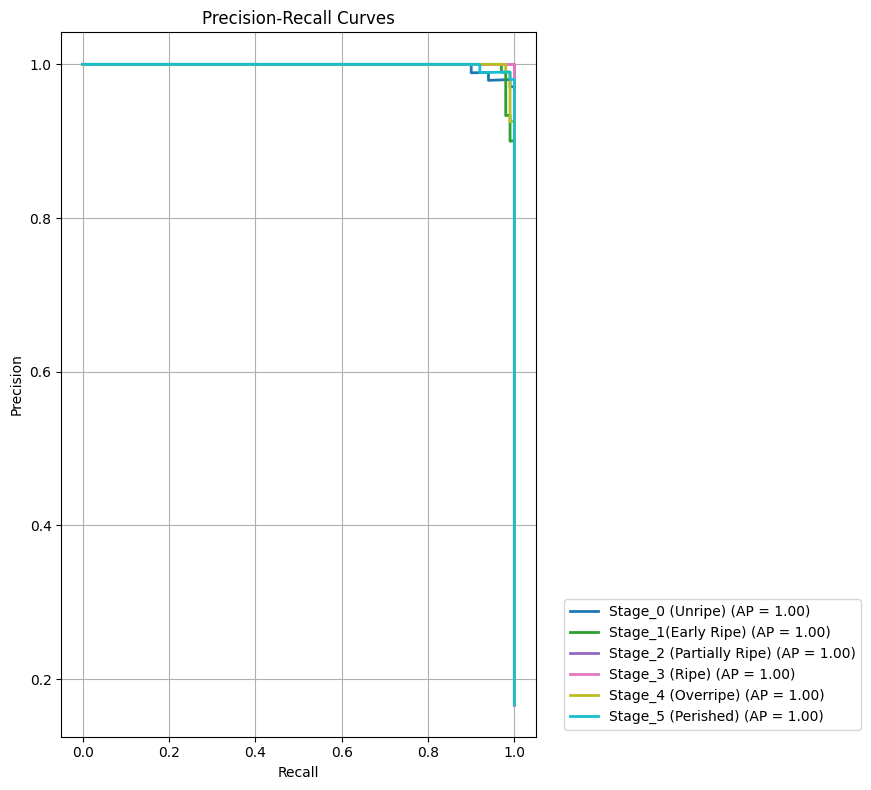


Average Precision Scores:
Stage_0 (Unripe): 0.998
Stage_1(Early Ripe): 0.998
Stage_2 (Partially Ripe): 1.000
Stage_3 (Ripe): 1.000
Stage_4 (Overripe): 0.999
Stage_5 (Perished): 0.999


In [14]:
import numpy as np
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt

# Get predictions and true labels
y_test = test_generator.classes
y_pred_proba = model.predict(test_generator)

# Binarize the labels for multi-class ROC
n_classes = 6
y_test_bin = label_binarize(y_test, classes=np.arange(n_classes))

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(y_test_bin.ravel(), y_pred_proba.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# Plot ROC curves
plt.figure(figsize=(12, 8))

# Plot individual class ROC curves
colors = plt.cm.get_cmap('tab10')(np.linspace(0, 1, n_classes))
class_names = list(test_generator.class_indices.keys())

for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'{class_names[i]} (AUC = {roc_auc[i]:.2f})')

# Plot micro-average ROC curve
plt.plot(fpr["micro"], tpr["micro"],
         label=f'Micro-average (AUC = {roc_auc["micro"]:.2f})',
         color='deeppink', linestyle=':', linewidth=4)

# Plot diagonal line
plt.plot([0, 1], [0, 1], 'k--', lw=2)

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curves')
plt.legend(loc="lower right", bbox_to_anchor=(1.7, 0))
plt.grid(True)
plt.tight_layout()
plt.show()

# Print AUC scores for each class
print("\nAUC Scores:")
for i in range(n_classes):
    print(f"{class_names[i]}: {roc_auc[i]:.3f}")
print(f"Micro-average: {roc_auc['micro']:.3f}")

# Calculate and plot precision-recall curve
from sklearn.metrics import precision_recall_curve, average_precision_score

# Calculate precision-recall curve for each class
precision = dict()
recall = dict()
avg_precision = dict()

plt.figure(figsize=(12, 8))

for i in range(n_classes):
    precision[i], recall[i], _ = precision_recall_curve(y_test_bin[:, i], y_pred_proba[:, i])
    avg_precision[i] = average_precision_score(y_test_bin[:, i], y_pred_proba[:, i])
    plt.plot(recall[i], precision[i], color=colors[i], lw=2,
             label=f'{class_names[i]} (AP = {avg_precision[i]:.2f})')

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curves')
plt.legend(loc="lower right", bbox_to_anchor=(1.7, 0))
plt.grid(True)
plt.tight_layout()
plt.show()

# Print average precision scores
print("\nAverage Precision Scores:")
for i in range(n_classes):
    print(f"{class_names[i]}: {avg_precision[i]:.3f}")

In [15]:
class_indices = test_generator.class_indices
indices = {v:k for k,v in class_indices.items()}

In [16]:
filenames = test_generator.filenames

In [17]:
# Create a DataFrame with filenames, actual, and predicted labels
val_df = pd.DataFrame()
val_df['filename'] = filenames
val_df['actual'] = y_test  # Correcting this to use y_test instead of y_val
val_df['predicted'] = y_pred

# Map the integer labels to the actual class names using the indices dictionary
val_df['actual'] = val_df['actual'].apply(lambda x: indices[x])
val_df['predicted'] = val_df['predicted'].apply(lambda x: indices[x])

# Add a column 'Same' to indicate whether actual and predicted labels match
val_df['Same'] = val_df['actual'] == val_df['predicted']

# Display the first 10 rows of the DataFrame
val_df.head(10)

,filename,actual,predicted,Same
0,Stage_0 (Unripe)/UR103.jpg,Stage_0 (Unripe),Stage_0 (Unripe),True
1,Stage_0 (Unripe)/UR120.jpg,Stage_0 (Unripe),Stage_0 (Unripe),True
2,Stage_0 (Unripe)/UR122.jpg,Stage_0 (Unripe),Stage_0 (Unripe),True
3,Stage_0 (Unripe)/UR125.jpg,Stage_0 (Unripe),Stage_0 (Unripe),True
4,Stage_0 (Unripe)/UR127.jpg,Stage_0 (Unripe),Stage_0 (Unripe),True
5,Stage_0 (Unripe)/UR138.jpg,Stage_0 (Unripe),Stage_0 (Unripe),True
6,Stage_0 (Unripe)/UR14.jpg,Stage_0 (Unripe),Stage_0 (Unripe),True
7,Stage_0 (Unripe)/UR162.jpg,Stage_0 (Unripe),Stage_0 (Unripe),True
8,Stage_0 (Unripe)/UR170.jpg,Stage_0 (Unripe),Stage_0 (Unripe),True
9,Stage_0 (Unripe)/UR171.jpg,Stage_0 (Unripe),Stage_0 (Unripe),True


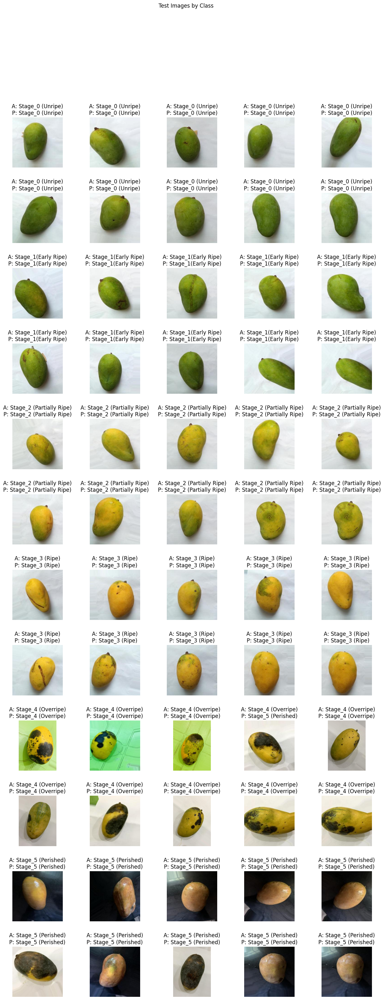

In [18]:
import matplotlib.pyplot as plt
import os

# Define the readImage function
def readImage(image_path):
    """Reads an image from the given path."""
    return plt.imread(image_path)

def display_images_per_class(temp_df, title="Images by Class", images_per_class=10, dataset_dir='/kaggle/working/split_dataset/test'):
    """
    Displays a specified number of images for each class from the DataFrame.
    
    Parameters:
    - temp_df: DataFrame containing filenames, actual labels, and predicted labels.
    - title: Title for the entire plot.
    - images_per_class: Number of images to display per class.
    - dataset_dir: Path to the dataset directory.
    """
    # Get the unique classes
    classes = temp_df['actual'].unique()
    
    # Determine the number of rows needed for the subplots (5 columns)
    num_classes = len(classes)
    num_images = num_classes * images_per_class
    num_rows = (num_images + 4) // 5  # Add 4 for rounding up
    
    plt.figure(figsize=(15, 3 * num_rows))  # Adjust the figure size to fit all images
    
    subplot_index = 1  # Initialize subplot index
    
    for cls in classes:
        # Filter the DataFrame for the current class and sample the desired number of images
        class_df = temp_df[temp_df['actual'] == cls].sample(n=images_per_class, replace=True, random_state=42)
        
        for _, row in class_df.iterrows():
            plt.subplot(num_rows, 5, subplot_index)
            plt.subplots_adjust(hspace=0.5, wspace=0.3)
            
            # Ensure the path includes the subdirectory structure (e.g., 'Stage_0 (Unripe)/UR103.jpg')
            image_path = f"{dataset_dir}/{row['filename']}"
            
            # Check if the file exists before attempting to load the image
            if os.path.exists(image_path):
                # Load the image using the `readImage` function
                image = readImage(image_path)
                
                # Display the image
                plt.imshow(image)
                plt.title(f'A: {row.actual}\nP: {row.predicted}')
                plt.axis('off')  # Hide axis for a clean look
            else:
                plt.text(0.5, 0.5, "File not found", horizontalalignment='center', verticalalignment='center')
                plt.axis('off')  # Hide axis if image is not found
            
            subplot_index += 1  # Increment subplot index
    
    plt.suptitle(title)  # Title for the entire plot
    plt.show()

# Example usage (display 10 images per class from the test dataset)
display_images_per_class(
    temp_df=val_df, 
    title="Test Images by Class", 
    images_per_class=10, 
    dataset_dir='/kaggle/working/split_dataset/test'
)


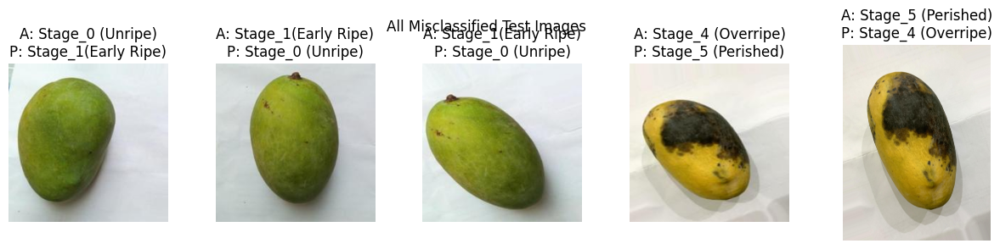

In [19]:
def display_all_misclassified_images(temp_df, title="All Misclassified Images", max_images=50, dataset_dir='/kaggle/working/split_dataset/test'):
    """
    Displays all misclassified images from the dataset.
    
    Parameters:
    - temp_df: DataFrame containing filenames, actual labels, and predicted labels.
    - title: Title for the plot.
    - max_images: Maximum number of misclassified images to display.
    - dataset_dir: Path to the dataset directory.
    """
    # Filter the DataFrame to include only misclassified rows
    misclassified_df = temp_df[temp_df['actual'] != temp_df['predicted']]
    
    # Limit the number of images to display
    num_images = min(len(misclassified_df), max_images)
    
    # Calculate the number of rows and columns for the plot
    num_columns = 5
    num_rows = (num_images + num_columns - 1) // num_columns  # Round up
    
    plt.figure(figsize=(15, 3 * num_rows))  # Adjust the figure size
    
    for i, (_, row) in enumerate(misclassified_df.iterrows()):
        if i >= max_images:  # Stop if we've reached the max number of images
            break
        
        plt.subplot(num_rows, num_columns, i + 1)
        plt.subplots_adjust(hspace=0.5, wspace=0.3)
        
        # Construct the full path to the image
        image_path = os.path.join(dataset_dir, row['filename'])
        
        # Check if the file exists
        if os.path.exists(image_path):
            # Load and display the image
            image = readImage(image_path)
            plt.imshow(image)
            plt.title(f'A: {row.actual}\nP: {row.predicted}')
            plt.axis('off')
        else:
            # Handle missing files
            plt.text(0.5, 0.5, "File not found", horizontalalignment='center', verticalalignment='center')
            plt.axis('off')
    
    plt.suptitle(title)  # Title for the entire plot
    plt.show()

# Example usage
display_all_misclassified_images(
    temp_df=val_df, 
    title="All Misclassified Test Images", 
    max_images=50,  # Maximum number of images to display
    dataset_dir='/kaggle/working/split_dataset/test'  # Path to the test dataset
)

Available layers in the model:
0: input_layer (InputLayer)
1: zero_padding2d (ZeroPadding2D)
2: conv1_conv (Conv2D)
3: conv1_bn (BatchNormalization)
4: conv1_relu (Activation)
5: zero_padding2d_1 (ZeroPadding2D)
6: pool1 (MaxPooling2D)
7: conv2_block1_0_bn (BatchNormalization)
8: conv2_block1_0_relu (Activation)
9: conv2_block1_1_conv (Conv2D)
10: conv2_block1_1_bn (BatchNormalization)
11: conv2_block1_1_relu (Activation)
12: conv2_block1_2_conv (Conv2D)
13: conv2_block1_concat (Concatenate)
14: conv2_block2_0_bn (BatchNormalization)
15: conv2_block2_0_relu (Activation)
16: conv2_block2_1_conv (Conv2D)
17: conv2_block2_1_bn (BatchNormalization)
18: conv2_block2_1_relu (Activation)
19: conv2_block2_2_conv (Conv2D)
20: conv2_block2_concat (Concatenate)
21: conv2_block3_0_bn (BatchNormalization)
22: conv2_block3_0_relu (Activation)
23: conv2_block3_1_conv (Conv2D)
24: conv2_block3_1_bn (BatchNormalization)
25: conv2_block3_1_relu (Activation)
26: conv2_block3_2_conv (Conv2D)
27: conv2_blo

/tmp/ipykernel_23/1334153364.py:113: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


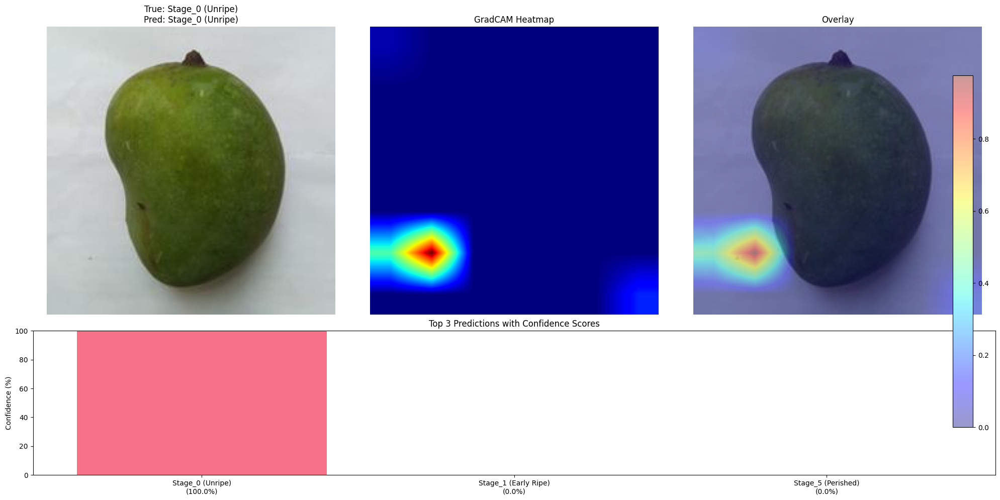

Using layer: conv5_block32_2_conv


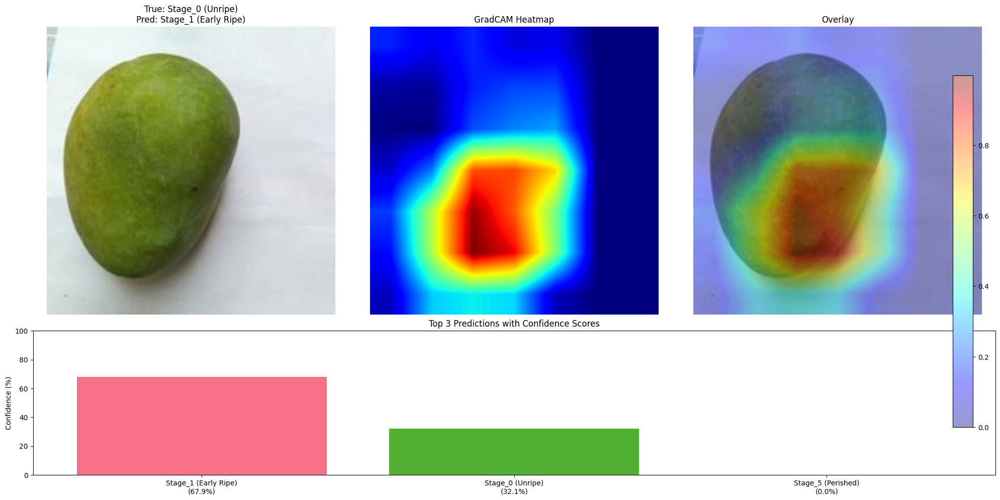

Using layer: conv5_block32_2_conv


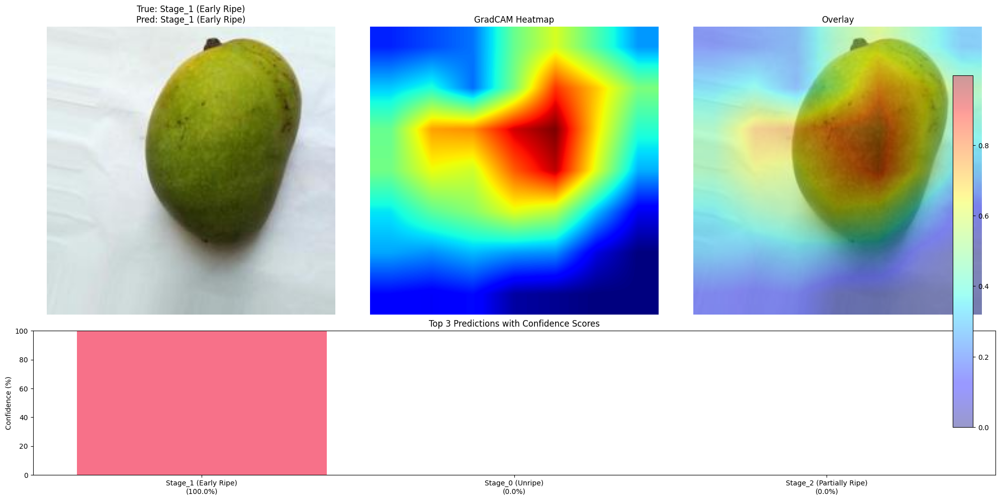

Using layer: conv5_block32_2_conv


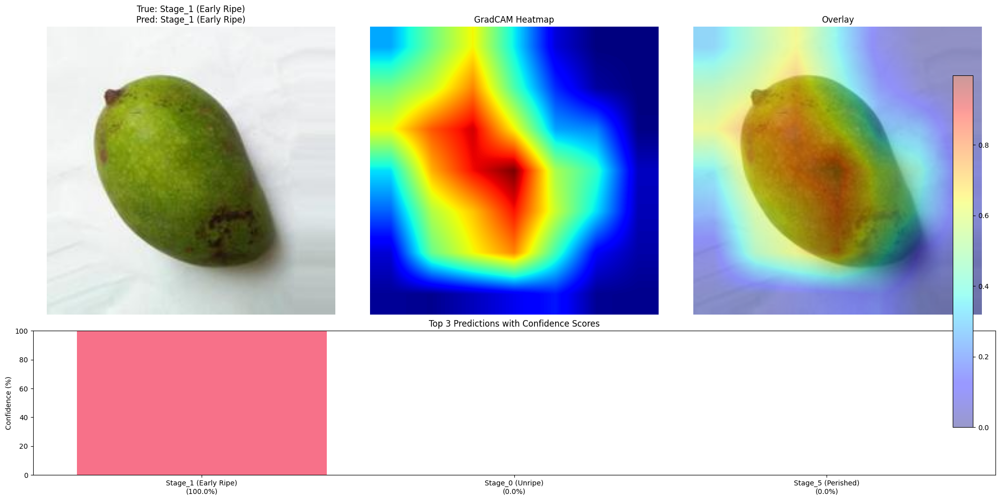

Using layer: conv5_block32_2_conv


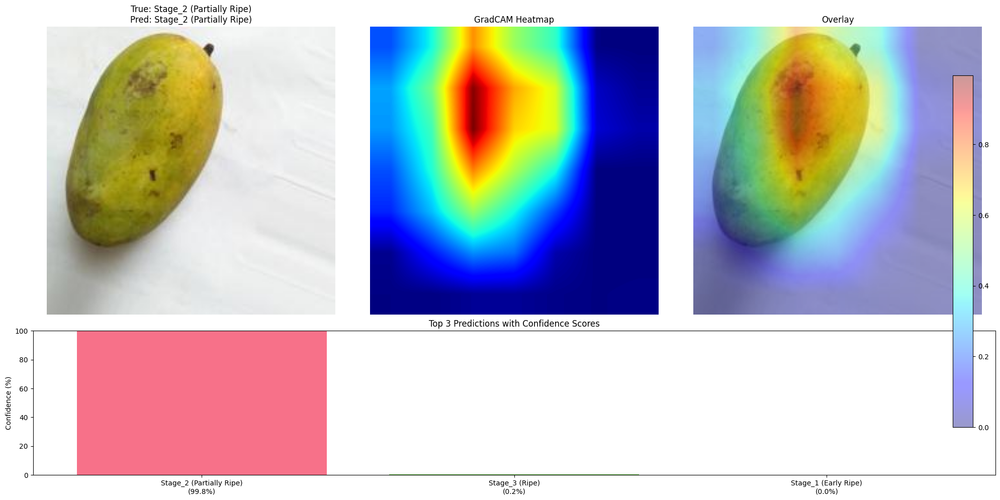

Using layer: conv5_block32_2_conv


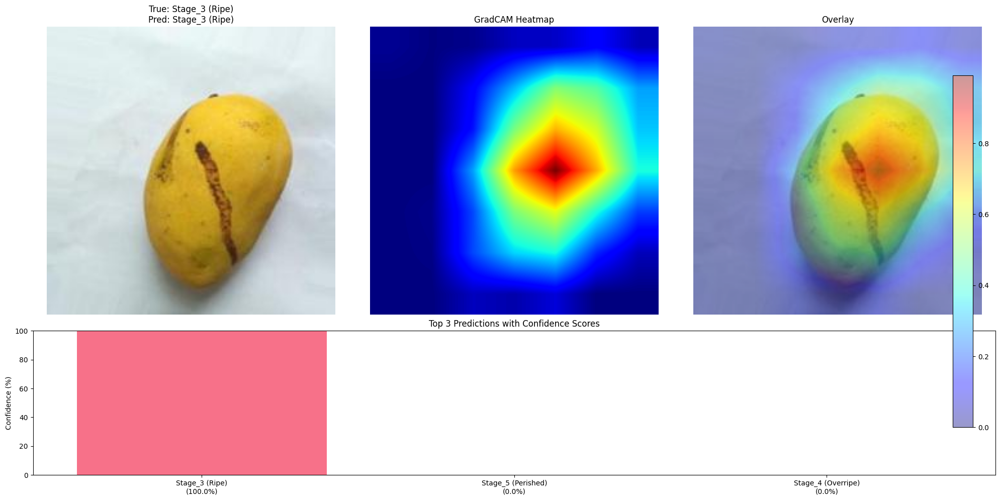

Using layer: conv5_block32_2_conv


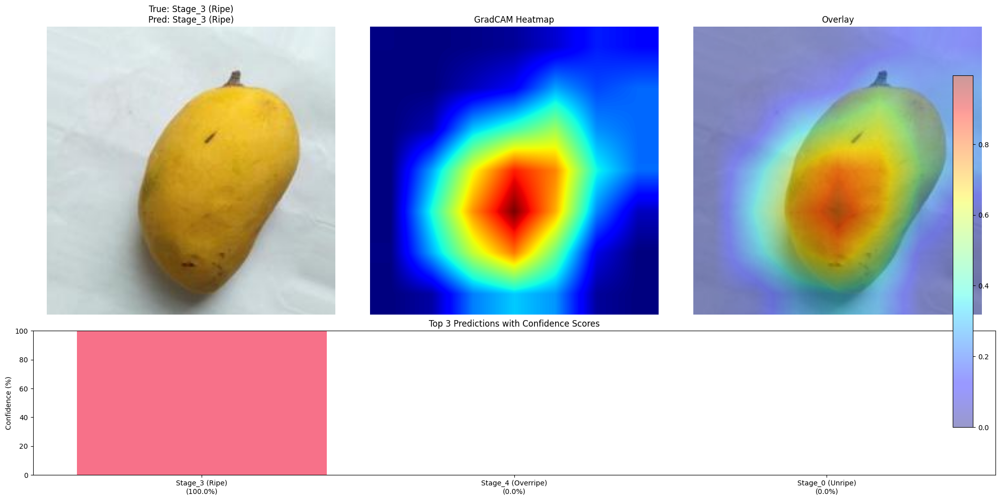

Using layer: conv5_block32_2_conv


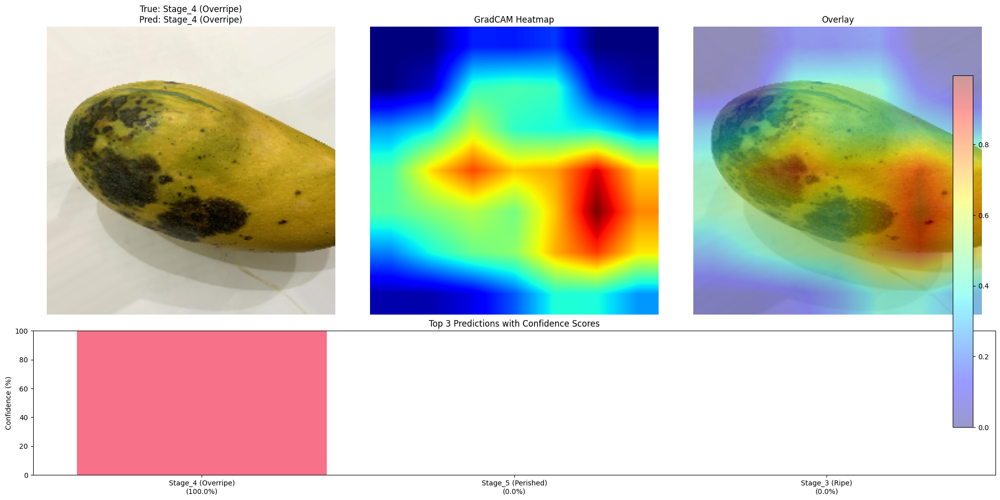

Using layer: conv5_block32_2_conv


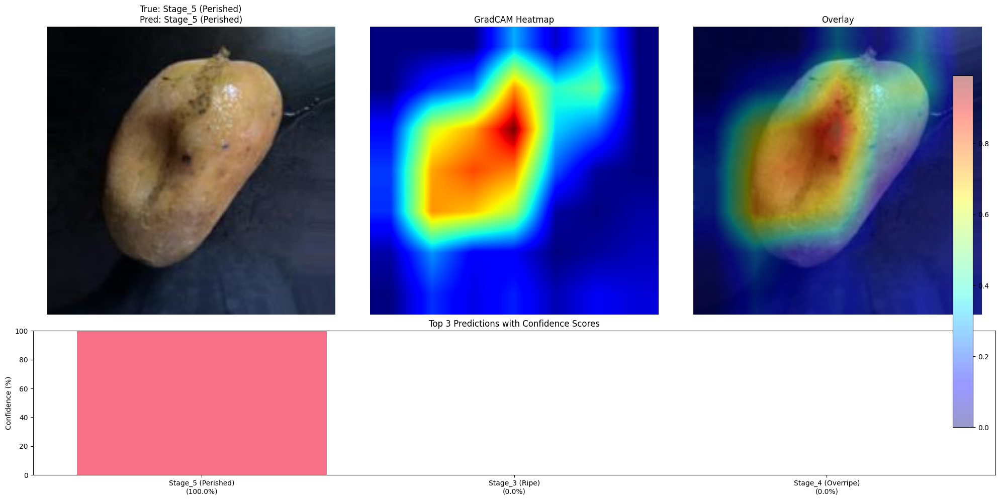

Using layer: conv5_block32_2_conv


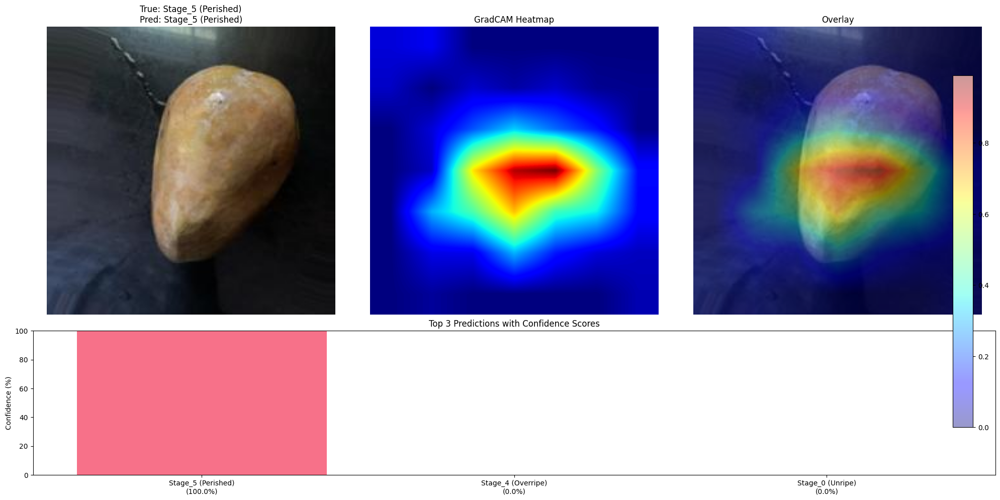

Using layer: conv5_block32_2_conv


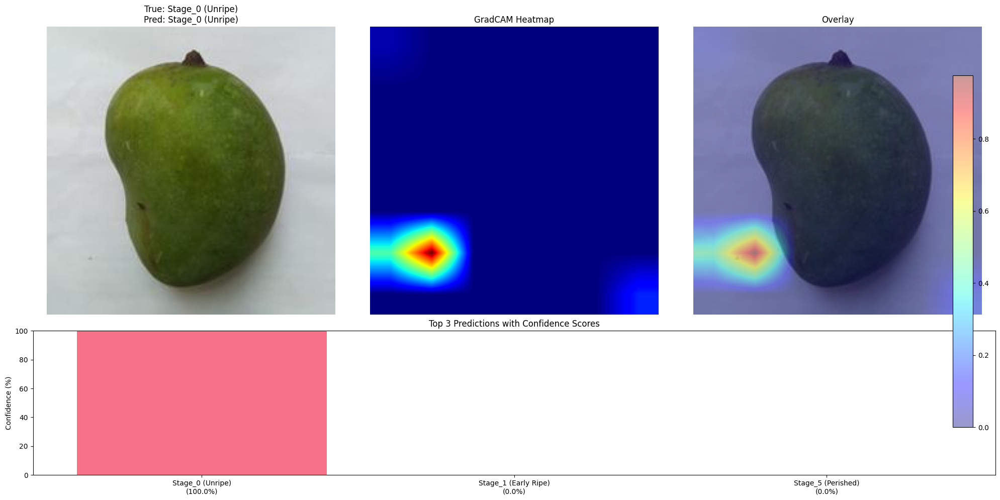

Using layer: conv5_block32_2_conv


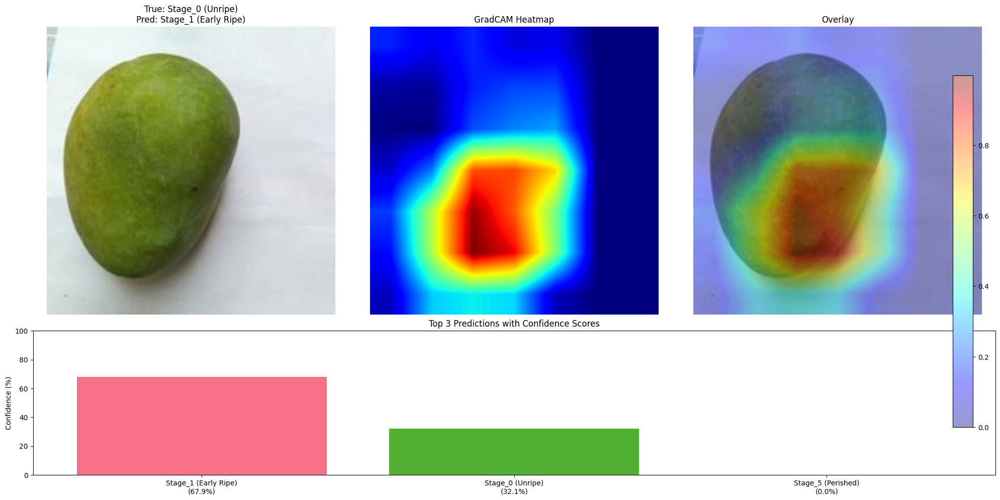

Using layer: conv5_block32_2_conv


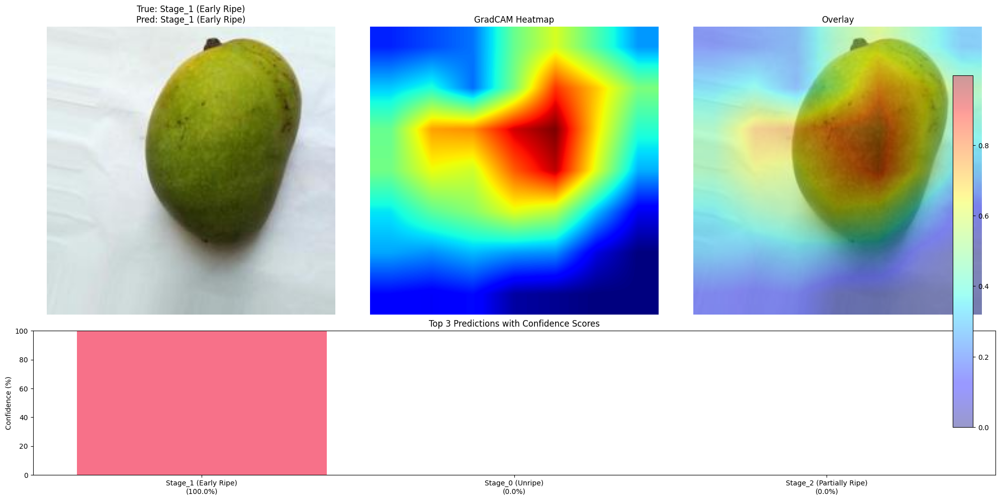

Using layer: conv5_block32_2_conv


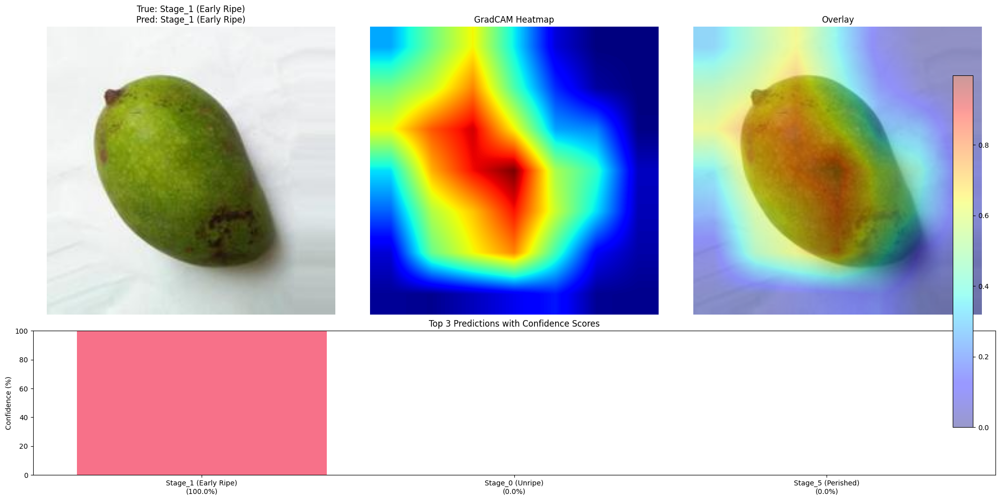

Using layer: conv5_block32_2_conv


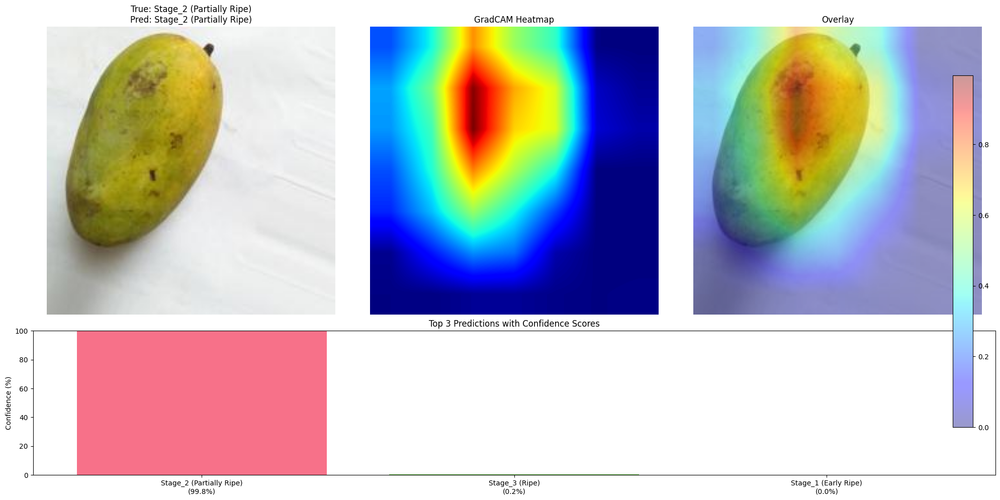

Using layer: conv5_block32_2_conv


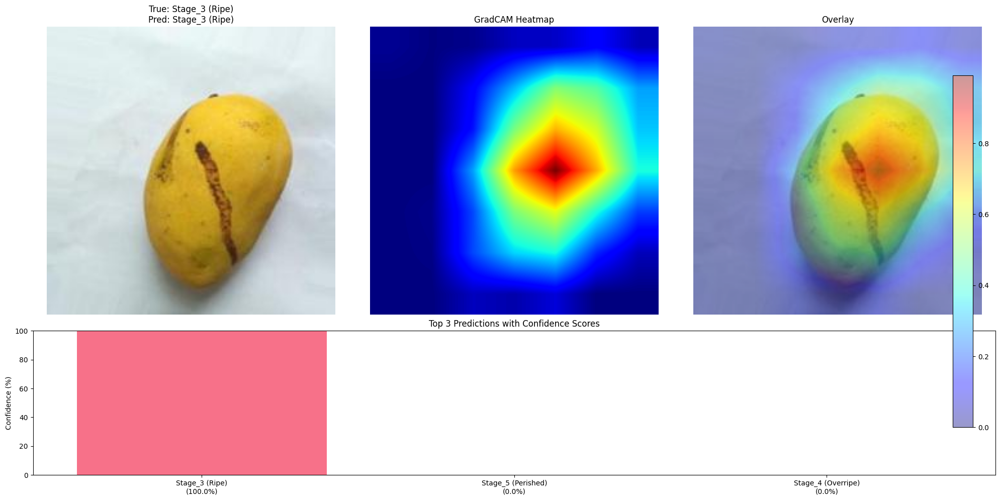

Using layer: conv5_block32_2_conv


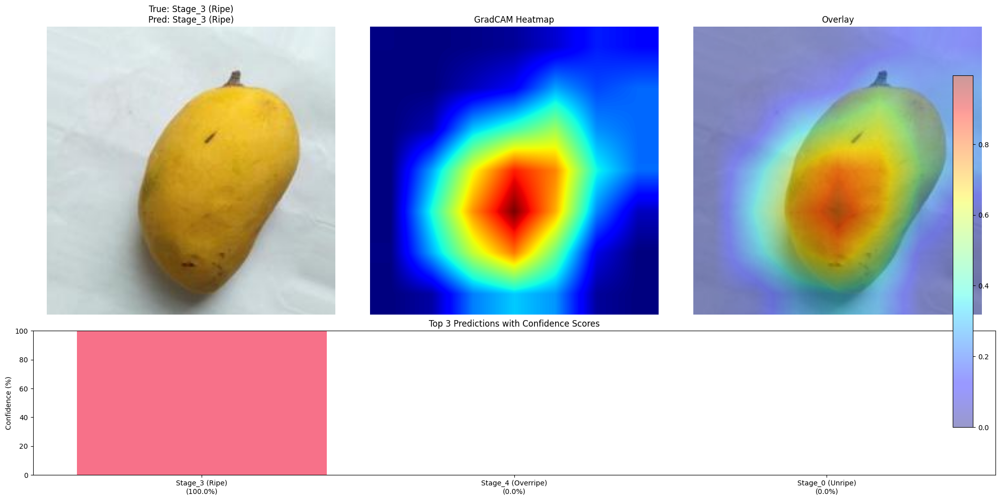

Using layer: conv5_block32_2_conv


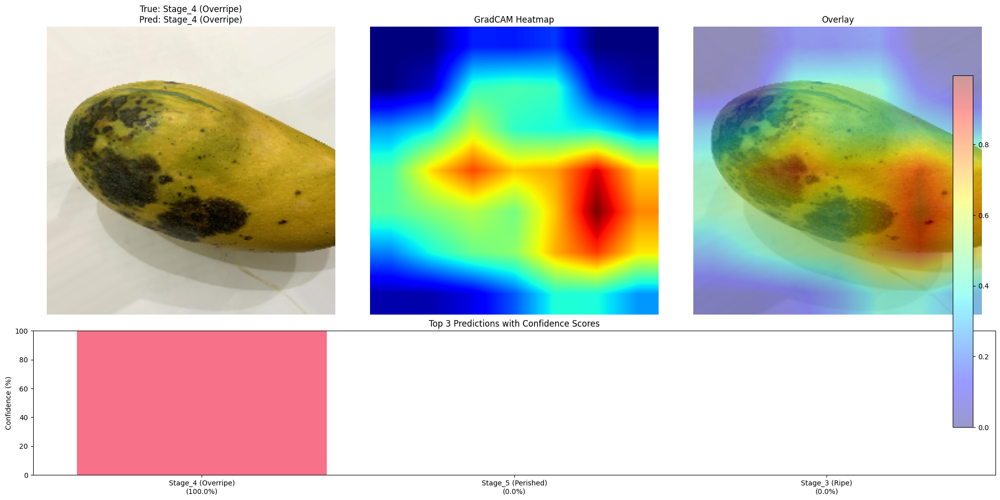

Using layer: conv5_block32_2_conv


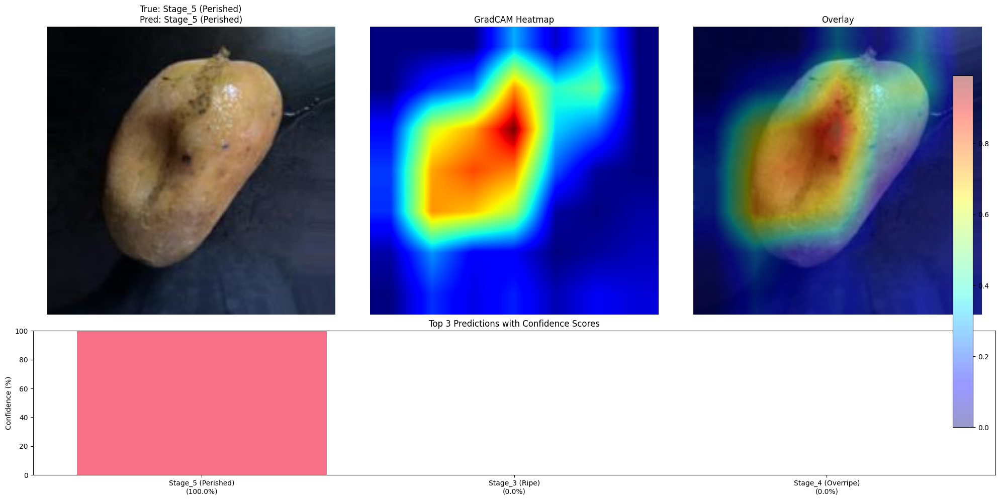

Using layer: conv5_block32_2_conv


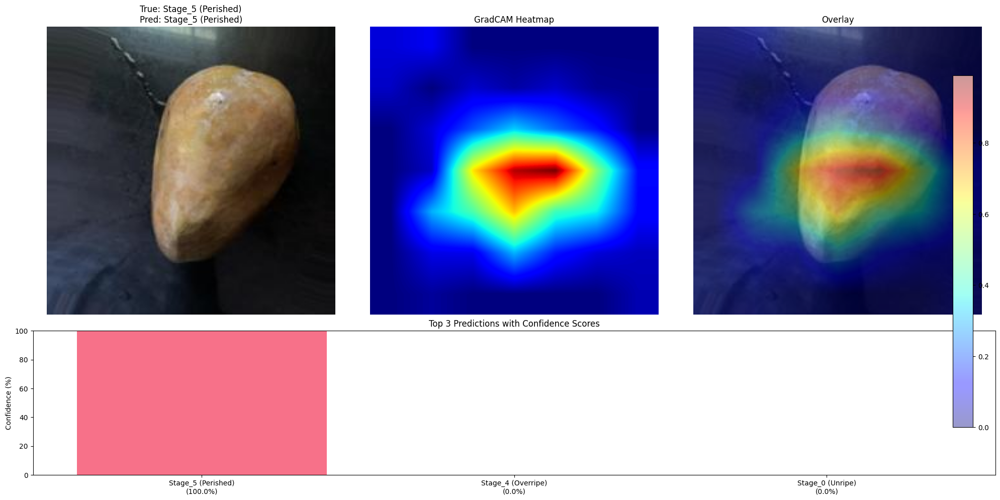

In [20]:
import tensorflow as tf
import numpy as np
import cv2
import matplotlib.pyplot as plt
from matplotlib import cm
import seaborn as sns

def get_last_conv_layer(model, layer_name=None):
    """Get the last convolutional layer or a specific layer by name"""
    if layer_name:
        try:
            return model.get_layer(layer_name)
        except:
            print(f"Layer {layer_name} not found. Using last conv layer instead.")
    
    # If no specific layer is requested or layer not found, get last conv layer
    for layer in reversed(model.layers):
        # Check for both Conv2D and SeparableConv2D (used in Xception)
        if isinstance(layer, (tf.keras.layers.Conv2D, tf.keras.layers.SeparableConv2D)):
            print(f"Using layer: {layer.name}")
            return layer
    raise ValueError("No convolutional layer found")

def make_gradcam_heatmap(img_array, model, layer_name=None):
    """
    Generate GradCAM heatmap with specified layer
    Returns heatmap, predicted class, and confidence scores
    """
    target_layer = get_last_conv_layer(model, layer_name)
    
    grad_model = tf.keras.models.Model(
        inputs=model.inputs,
        outputs=[target_layer.output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_output, predictions = grad_model(img_array)
        class_predictions = predictions[0]
        pred_index = tf.argmax(class_predictions)
        class_channel = predictions[:, pred_index]

    # Gradient of the top predicted class with regard to the output feature map
    grads = tape.gradient(class_channel, conv_output)
    
    # Global average pooling of the gradients
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    conv_output = conv_output[0]
    
    # Weight the channels by corresponding gradients
    heatmap = conv_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    
    # ReLU and normalization
    heatmap = tf.maximum(heatmap, 0) / tf.reduce_max(heatmap)
    
    # Get top 3 predictions and their confidences
    top_3_idx = tf.argsort(class_predictions, direction='DESCENDING')[:3]
    top_3_conf = tf.gather(class_predictions, top_3_idx)
    
    return heatmap.numpy(), pred_index.numpy(), top_3_idx.numpy(), top_3_conf.numpy()

def visualize_gradcam_batch(model, test_generator, num_images=5, layer_name=None):
    stage_names = ['Stage_0 (Unripe)', 'Stage_1 (Early Ripe)', 
                  'Stage_2 (Partially Ripe)', 'Stage_3 (Ripe)',
                  'Stage_4 (Overripe)', 'Stage_5 (Perished)']
    
    test_generator.reset()
    for _ in range(num_images):
        image_batch, label_batch = next(test_generator)
        img = image_batch[0:1]
        true_class = np.argmax(label_batch[0])
        
        heatmap, pred_class, top_3_idx, top_3_conf = make_gradcam_heatmap(img, model, layer_name)
        heatmap = cv2.resize(heatmap, (224, 224))
        
        # Create figure with subplots
        fig = plt.figure(figsize=(20, 10))
        gs = plt.GridSpec(2, 3, height_ratios=[2, 1])
        
        # Original Image
        ax1 = plt.subplot(gs[0, 0])
        ax1.imshow(img[0])
        ax1.set_title(f'True: {stage_names[true_class]}\nPred: {stage_names[pred_class]}')
        ax1.axis('off')
        
        # Heatmap
        ax2 = plt.subplot(gs[0, 1])
        ax2.imshow(heatmap, cmap='jet')
        ax2.set_title('GradCAM Heatmap')
        ax2.axis('off')
        
        # Overlay
        ax3 = plt.subplot(gs[0, 2])
        ax3.imshow(img[0])
        overlay = ax3.imshow(heatmap, alpha=0.4, cmap='jet')
        ax3.set_title('Overlay')
        ax3.axis('off')
        
        # Confidence Plot
        ax4 = plt.subplot(gs[1, :])
        labels = [f"{stage_names[i]}\n({top_3_conf[j]*100:.1f}%)" 
                 for j, i in enumerate(top_3_idx)]
        colors = sns.color_palette("husl", 3)
        bars = ax4.bar(labels, top_3_conf * 100, color=colors)
        ax4.set_ylim([0, 100])
        ax4.set_ylabel('Confidence (%)')
        ax4.set_title('Top 3 Predictions with Confidence Scores')
        
        # Add colorbar for heatmap
        cbar_ax = fig.add_axes([0.95, 0.15, 0.02, 0.7])
        plt.colorbar(overlay, cax=cbar_ax)
        
        plt.tight_layout()
        plt.show()

# Print model layers to help with layer selection
print("Available layers in the model:")
for i, layer in enumerate(model.layers):
    print(f"{i}: {layer.name} ({layer.__class__.__name__})")

# Run visualization with specific layer (use None for last conv layer)
# Try different layers to see which gives better visualization
layer_choices = [
    None,  # Last conv layer
    'conv3_2',  # For Xception
    'conv5_block3_out'   # For ResNet
]

# Visualize using the last conv layer
visualize_gradcam_batch(model, test_generator, num_images=20, layer_name=layer_choices[0])